# Plotting the radiation transform

Here we examine the plots of the radiation transforms of a function f(x):

$$\begin{align}
F_{\mathcal{A}}(Z) & = \int_{-\infty}^\infty f(x) u_{\mathcal{A}}(x,Z) \, dx \\[.1cm]
F_{\mathcal{B}}(Z) & = \int_{-\infty}^\infty f(x) u_{\mathcal{B}}(x,Z) \, dx.
\end{align}$$

The subscripts $\mathcal{A}, \mathcal{B}$ distinguish between radiation mode classes (even or odd for symmetric structures).


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from fiberamp.fiber.microstruct.bragg import plotlogf
from scipy.optimize import newton
plt.style.use('dark_background')
%matplotlib widget

Set up input functions

In [2]:
def quadratic_piecewise(x):
    conds = [(x<-.5), ((-.5<=x)*(x<=.5)), (x>.5)]
    funcs = [0, lambda x: .25-x**2, 0]
    return np.piecewise(x, conds, funcs)
    
def modified_dist(x):
    return (x-1/4) * np.exp(-(x-1/2)**2)  

def odd_modified_dist(x):
    return x * np.exp(-x**2)
    
def normal_dist(x):
    return np.exp(-x**2)

## Basic 3 layer guide

Make slab object

In [3]:
A = SlabExact(symmetric=True)

Choose input function and set other parameters

In [4]:
f0 = quadratic_piecewise
f0_shifted = lambda x: f0(x) + A.n0
field_type = 'TE'
paper_method = False

Plot input function and refractive index

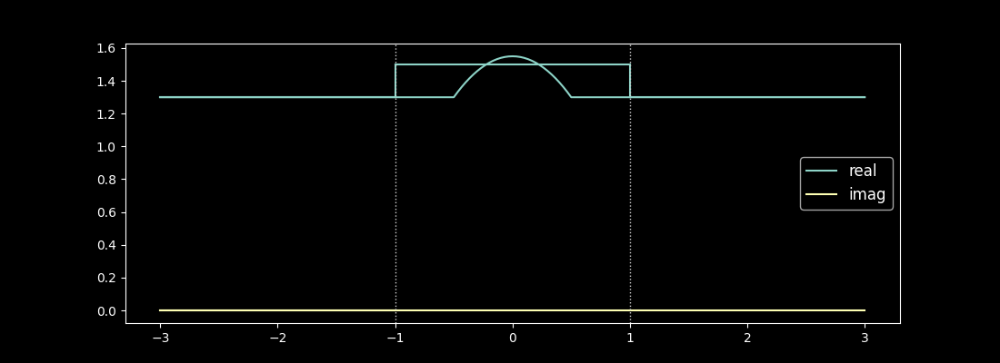

In [5]:
A.plot_refractive_index()
A.add_1d_plot(f0_shifted)

Define propagators to get access to associated transforms

In [48]:
Propagator_A = A.propagator()
method = 'eigvec'
Normalizer = A.normalizer(method)

In [49]:

P_even_A = Propagator_A(A.real_contour(.001, 6, 2), f0=f0, Lx=-.5, Rx=.5,
                    field_type=field_type, Normalizer=Normalizer,
                    sign='+1')

P_odd_A = Propagator_A(A.real_contour(.001, 6, 2), f0=f0, Lx=-.5, Rx=.5,
                   field_type=field_type, Normalizer=Normalizer,
                    sign='-1')

### Plot transforms

#### Even transform

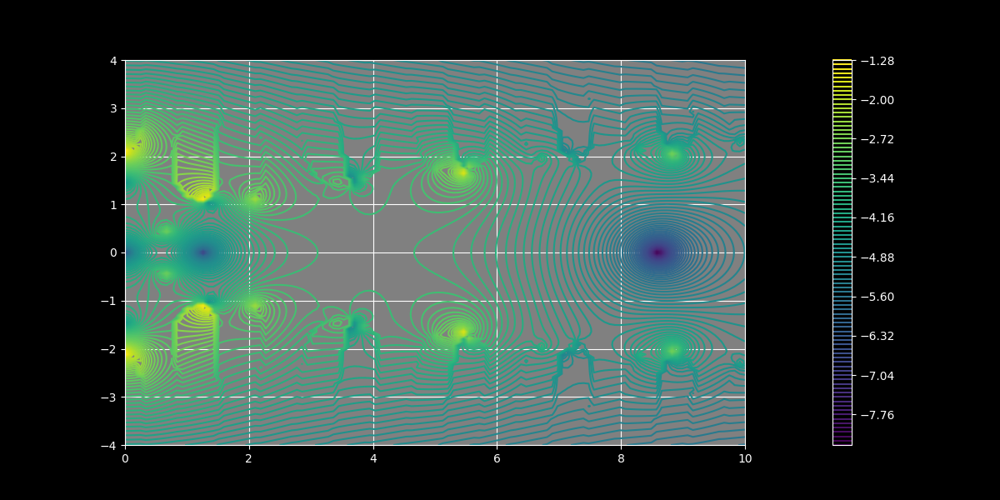

In [53]:
plotlogf(P_even_A.transform, 0, 10, -4, 4, iref=120, rref=120, levels=100)

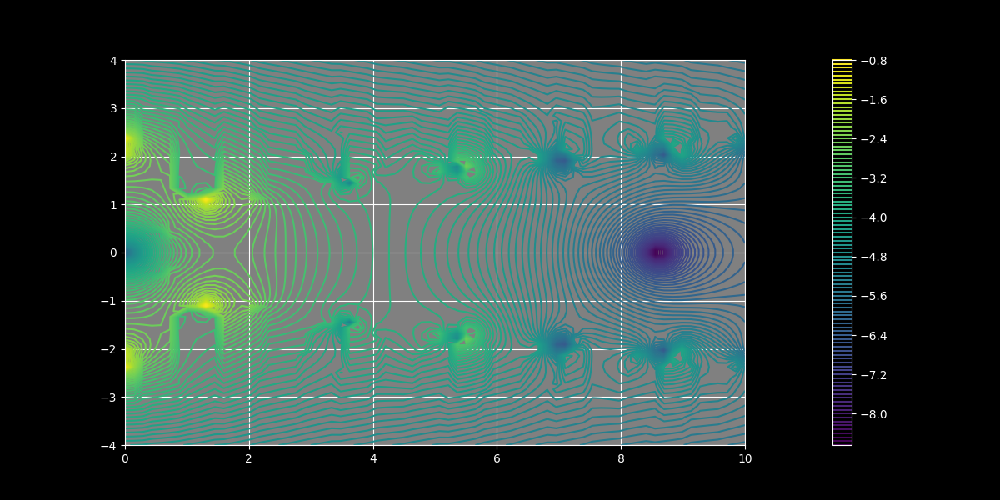

In [54]:
plotlogf(P_odd_A.transform, 0, 10, -4, 4, 
        iref=70, rref=70, levels=100)

### Observations

- With paper method, we have a sort of parabolic shaped region, enclosed by what appear to be branch cuts.
  
- Interestingly, for the odd transform with the paper method, even though the modes in the Z plane are not strictly odd, they appear to integrate to zero against an odd input function in the whole parabolic region.

### Plotting determinant and coefficients

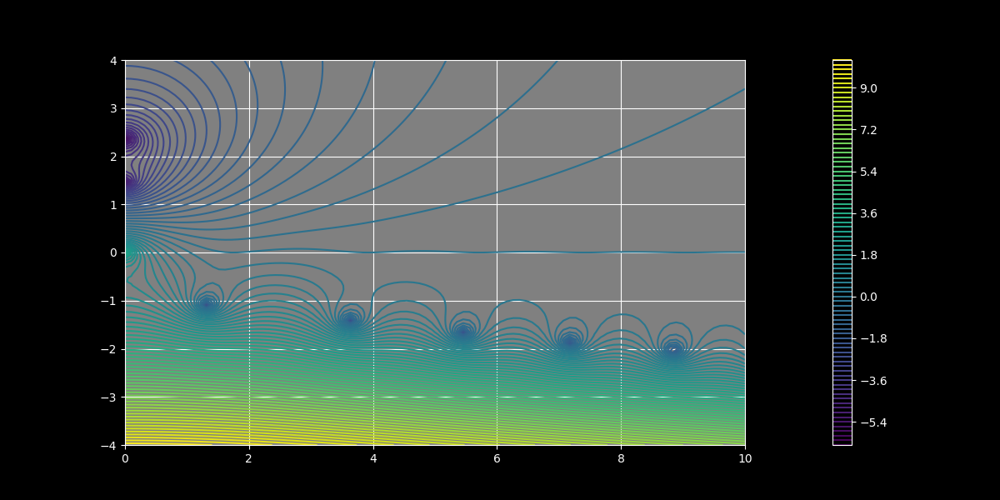

In [9]:
plotlogf(A.determinant_Z,  0, 10, -4, 4, 'TE', 'guided',  iref=100, rref=100, levels=100)

Find a zero

In [10]:
Z = newton(A.determinant_Z, np.array([1.7-1j]), args=('TE', 'guided'))
print(Z)
plt.plot(Z.real, Z.imag, 'ro');

[1.32142432-1.08850828j]


Look at coefficients

In [11]:
def coeffs(Z, sign='1', field_type='TE'):
    M = A.transmission_matrix_Z(Z)
    detM = A.transmission_determinant_Z(Z, field_type=field_type)
    frac = (-M[..., 1, 0] * detM) / M[..., 0, 1]
    b = int(sign) * np.sqrt(frac, dtype=complex)
    r1 = -M[..., 1, 0] / M[..., 1, 1]
    t2 = 1 / M[..., 1, 1]
    C = 1 / np.sqrt(r1 + b * t2, dtype=complex)
    return C


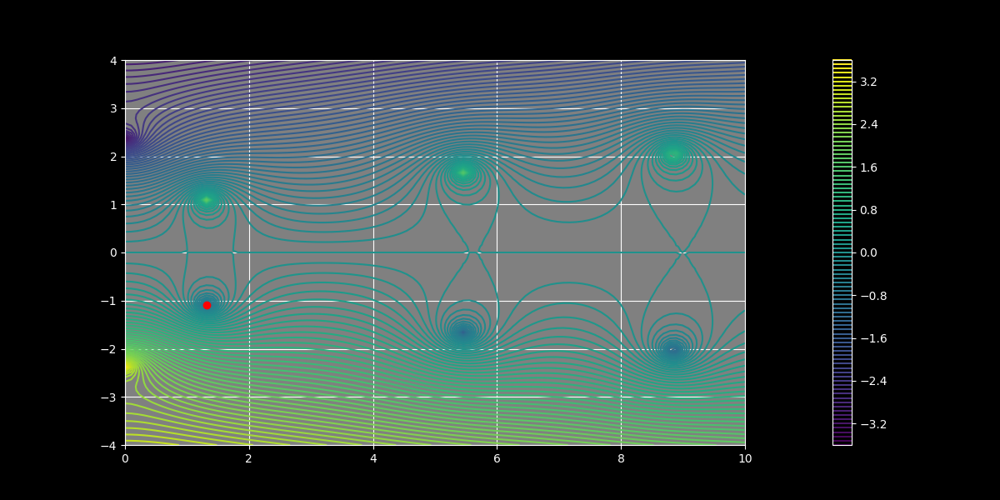

In [12]:
plotlogf(coeffs,  0, 10, -4, 4, iref=100, rref=100, levels=100)
plt.plot(Z.real, Z.imag, 'ro');

We know that this is a zero of the coefficients, although numerically we get fooled because of a square root that takes values near machine zero and makes them on the order of 1e-7, which appears to be non-trivial.

Compare to transform:

In [13]:
plotlogf(P_even_A.transform, 0, 10, -4, 4,
        iref=70, rref=70, levels=100)

KeyboardInterrupt: 

In [18]:
plt.plot(Z.real, Z.imag, 'ro');

Interestingly, it looks like the transform has a pole here.   Zooming in:

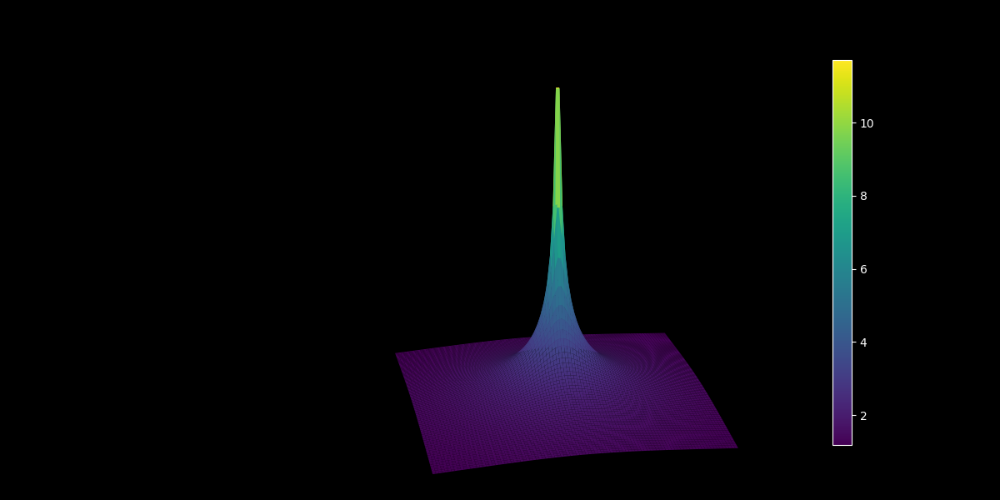

In [14]:
plotlogf(P_even_A.transform, Z.real-.001, Z.real+.001, Z.imag-.001, Z.imag+.001,
        iref=60, rref=60, log_off=True, three_D=True, cstride=1, rstride=1,
        elev=20, azim=-101)

### May be important to understand why this is a pole

In some ways it doesn't make sense that this should be pole.  The coefficients are going to zero as we near it.  So transform should go to zero too right?  This might point to a bug.

It's also hard to say for sure it's a pole, numerical issues might be masking something else.  Also, even if it were a pole, it's still just the transform.  The coefficients go to zero there and they still appear in the integrand.

In [15]:
even_integrand_A = lambda Z: coeffs(Z, '1', paper_method) * P_even_A.transform(Z)

Plot coefficients times transform

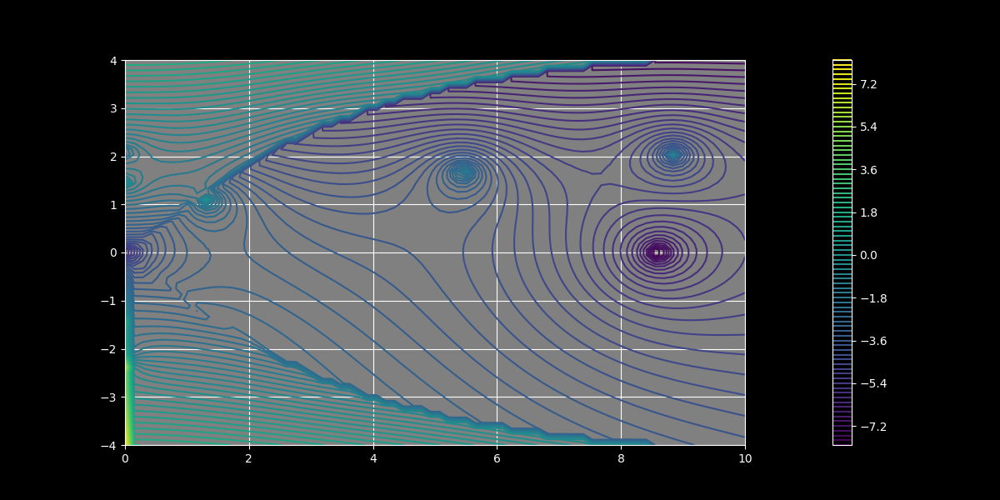

In [19]:
plotlogf(even_integrand_A, 0, 10, -4, 4,
        iref=70, rref=70, levels=100)

Right, now it appears that the pole is only at the upper part

In [20]:
plt.plot(Z.real, -Z.imag, 'ro');

Now we zoom in on that pole

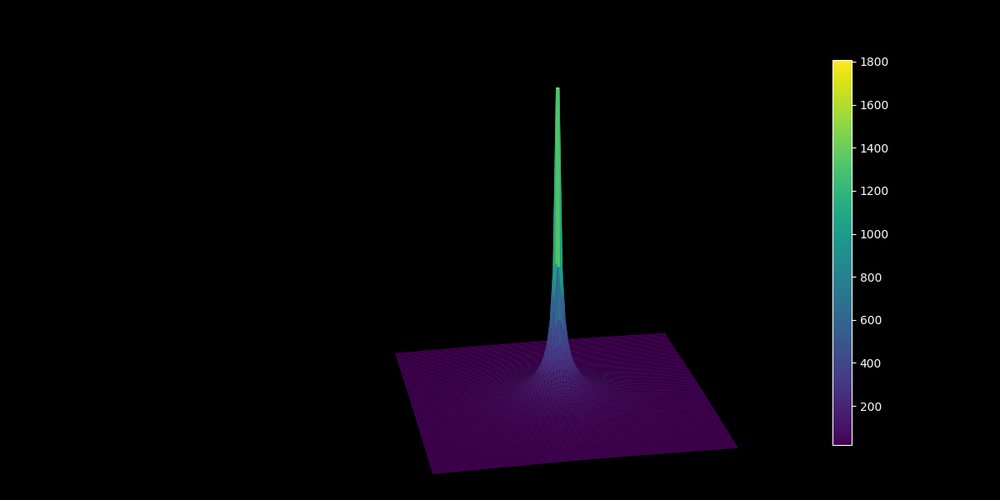

In [21]:
plotlogf(even_integrand_A, Z.real-.001, Z.real+.001, -Z.imag-.001, -Z.imag+.001,
        iref=100, rref=100, log_off=True, three_D=True, cstride=1, rstride=1,
        elev=20, azim=-101)

Now that is even more of a (seeming) pole.

But now we're back to the same problem we had.  If we do a contour integral around a pole with positive imaginary part, the growth of the resulting leaky mode is incorrect, it blows up as z increases.  Maybe there is a bug in the transform that is switching the locations of the poles...

## Antiguide

Now we examine a guide for which the leaky modes are the only modes we have

In [22]:
B = SlabExact(scale=1e-6, ts=[2e-6, 2e-6,2e-6],
              ns=[1.44, 1, 1.44], xrefs=[300, 500, 300],
              symmetric=True, wl=1e-6)

Choose input function and set other parameters

In [23]:
f0 = quadratic_piecewise
f0_shifted = lambda x: f0(x) + B.n0
field_type = 'TE'
paper_method = False

Plot input function and refractive index

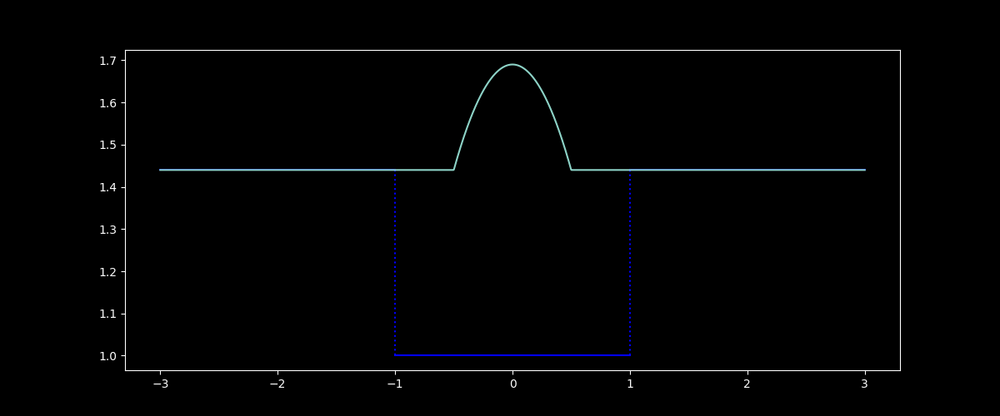

In [24]:
B.plot_refractive_index()
B.add_1d_plot(f0_shifted)

Define propagators for transform

In [25]:
Propagator_B = B.propagator()

In [26]:
P_even_B = Propagator_B(f0=f0, Lx=-.5, Rx=.5,
                    LZ=0.001, RZ=6, NZ=2,
                    field_type=field_type,
                    sign='+1', paper_method=paper_method)

P_odd_B = Propagator_B(f0=f0, Lx=-.5, Rx=.5,
                   LZ=0.001, RZ=6, NZ=2,
                   field_type=field_type,
                    sign='-1', paper_method=paper_method)

  0% (0 of 2) |                          | Elapsed Time: 0:00:00 ETA:  --:--:--

### Plot transforms

These are slow cells, about 30 seconds

#### Even transform

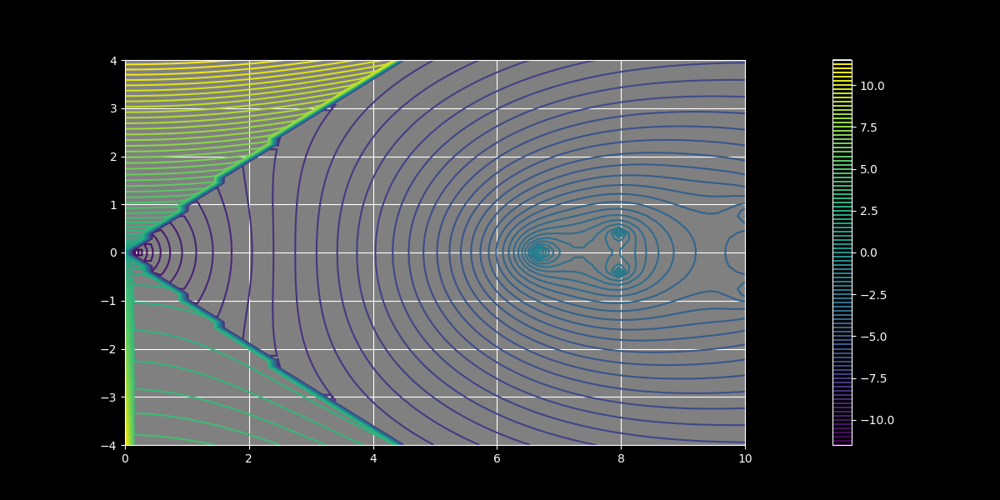

In [27]:
plotlogf(P_even_B.transform, 0, 10, -4, 4,
        iref=70, rref=70, levels=100)

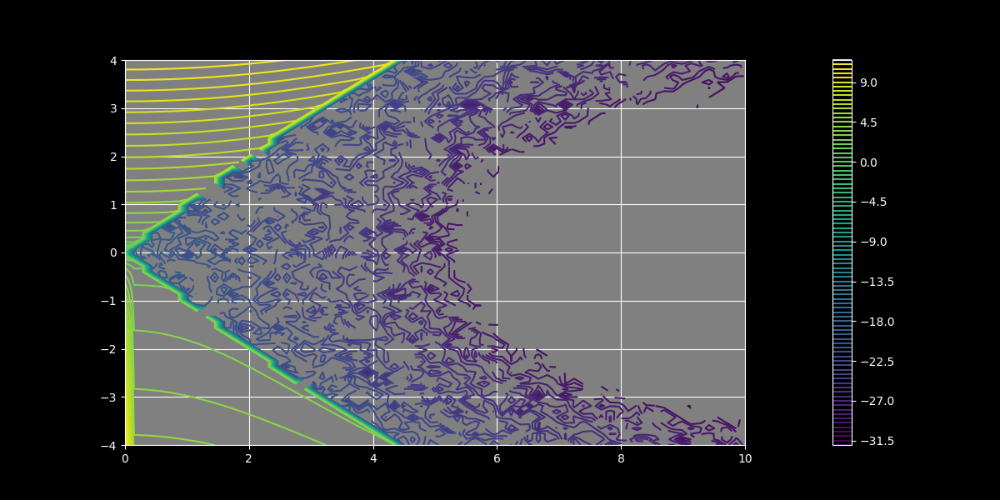

In [28]:
plotlogf(P_odd_B.transform, 0, 10, -4, 4,
        iref=70, rref=70, levels=100)

In [29]:
P_odd_B.transform(.01j)

array(0.+0.48623084j)

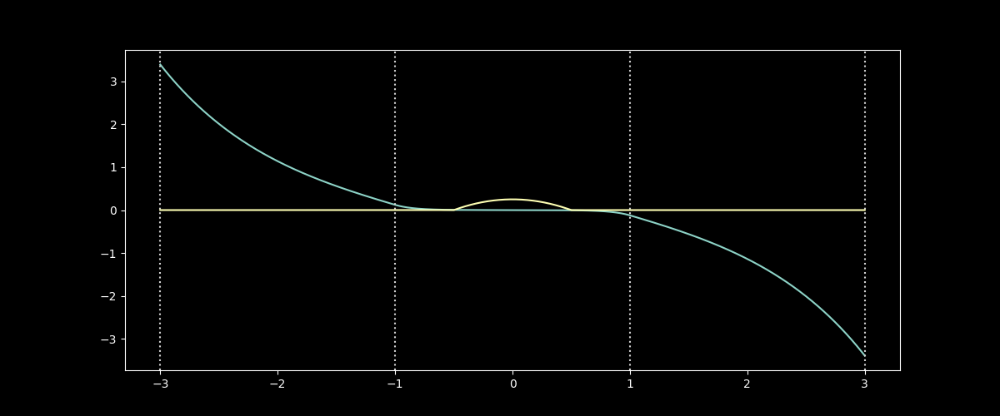

In [30]:
B.plot_field_1d(B.fields_Z(1j, mode_type='radiation', paper_method=paper_method, sign='-1'), part='imag', plot_axis=False);
B.add_1d_plot(f0)

### Observations

- Branch cut region is more triangular for this guide, with both paper and non-paper methods.
  
- For the non-paper method, even though the odd modes are odd for all Z, the even input f(x) doesn't integrate to zero against it...  It really seems like it should.

### Plotting determinant and coefficients

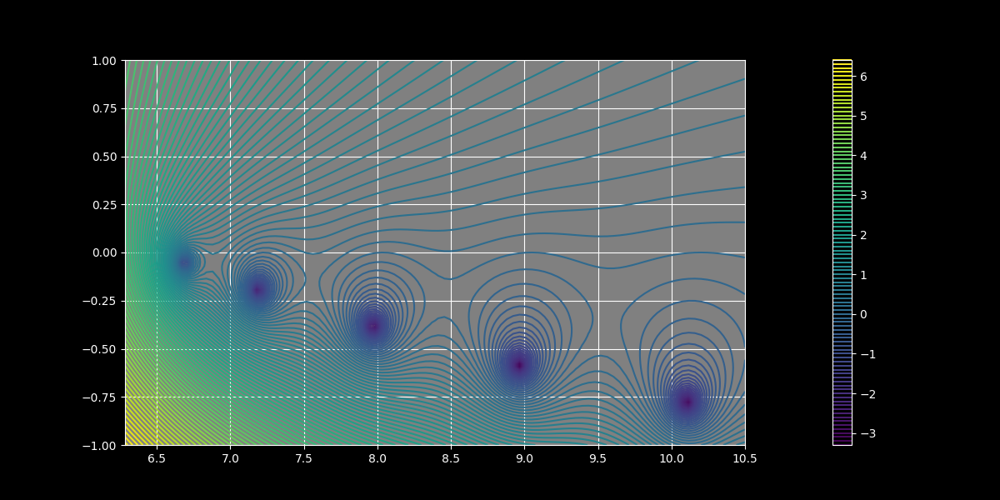

In [31]:
plotlogf(B.determinant_Z,  B.K_low, 10.5, -1, 1, 'TE', 'guided',  iref=100, rref=100, levels=100)

Find a zero

In [32]:
ZB = newton(B.determinant_Z, np.array([1.001*B.K_low]), args=('TE', 'guided'))
print(ZB)
plt.plot(ZB.real, ZB.imag, 'ro');

[6.68512884-0.05373814j]


Look at coefficients

In [33]:
def coeffsB(Z, sign='1', paper_method=True):
    M = B.transmission_matrix_Z(Z)
    frac = -M[..., 1, 0] / M[..., 0, 1]
    b = int(sign) * np.sqrt(frac, dtype=complex)
    r1 = -M[..., 1, 0] / M[..., 1, 1]
    t2 = 1 / M[..., 1, 1]
    C = 1 / np.sqrt(r1 + b * t2, dtype=complex)
    return C


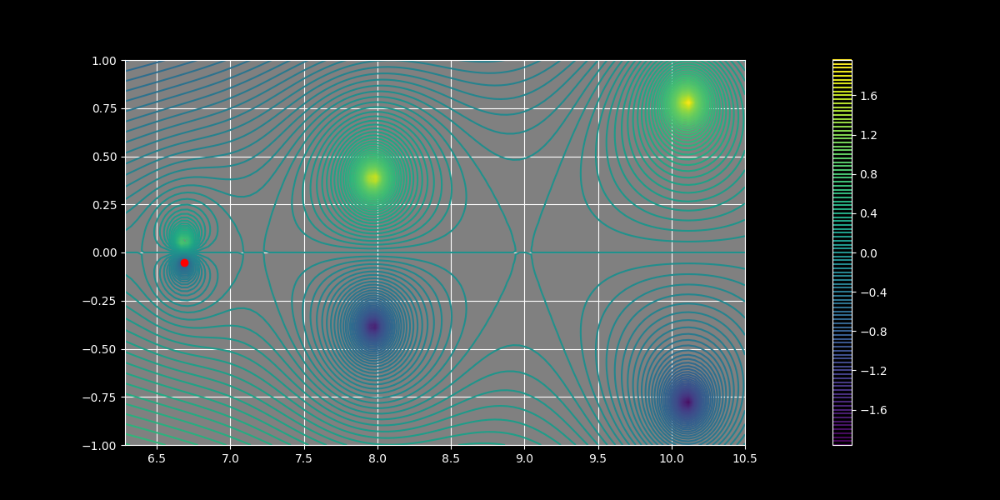

In [34]:
plotlogf(coeffsB,  B.K_low, 10.5, -1, 1,  iref=100, rref=100, levels=100)
plt.plot(ZB.real, ZB.imag, 'ro');

We know that this is a zero of the coefficients, although numerically we get fooled because of a square root that takes values near machine zero and makes them on the order of 1e-7, which appears to be non-trivial.

Compare to transform:

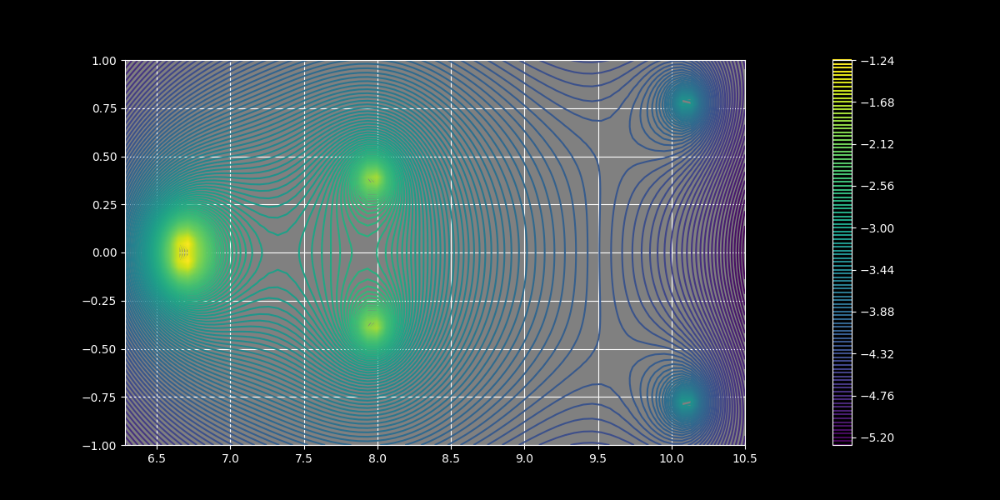

In [35]:
plotlogf(P_even_B.transform, B.K_low, 10.5, -1, 1,
        iref=70, rref=70, levels=100)

In [36]:
plt.plot(ZB.real, ZB.imag, 'ro');

Interestingly, it looks like the transform has a pole here.   Zooming in:

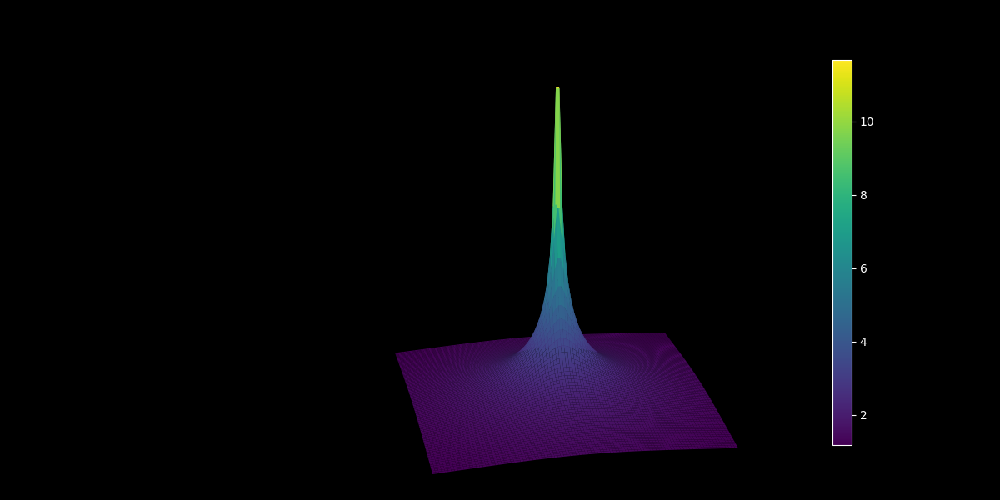

In [37]:
plotlogf(P_even_B.transform, ZB.real-.001, ZB.real+.001, ZB.imag-.001, ZB.imag+.001,
        iref=100, rref=100, log_off=True, three_D=True, cstride=1, rstride=1,
        elev=20, azim=-101)

### May be important to understand why this is a pole

In some ways it doesn't make sense that this should be pole.  The coefficients are going to zero as we near it.  So transform should go to zero too right?  This might point to a bug.

It's also hard to say for sure it's a pole, numerical issues might be masking something else.  Also, even if it were a pole, it's still just the transform.  The coefficients go to zero there and they still appear in the integrand.

In [38]:
even_integrand_B = lambda Z: coeffsB(Z, '1', paper_method) * P_even_B.transform(Z)

Plot coefficients times transform

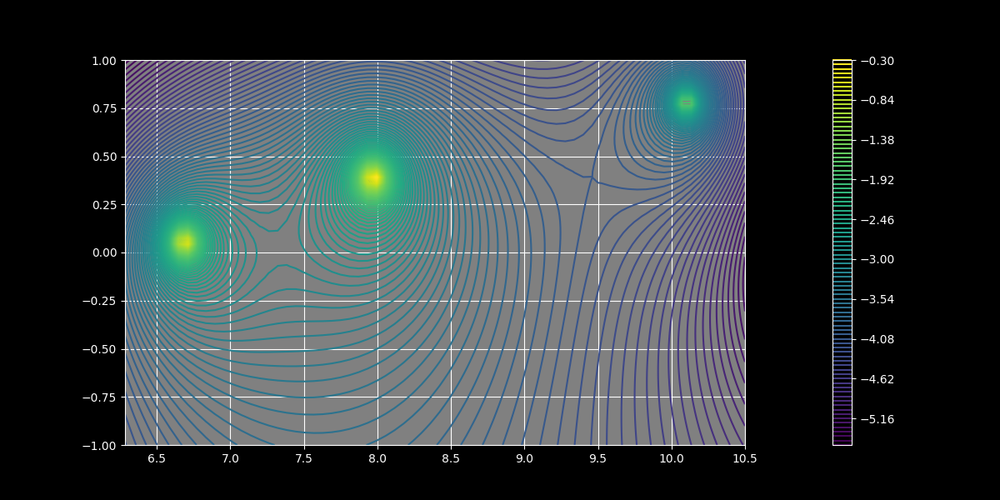

In [39]:
plotlogf(even_integrand_B, B.K_low, 10.5, -1, 1,
        iref=70, rref=70, levels=100)

Right, now it appears that the pole is only at the upper part

In [40]:
plt.plot(ZB.real, -ZB.imag, 'ro');

Now we zoom in on that pole

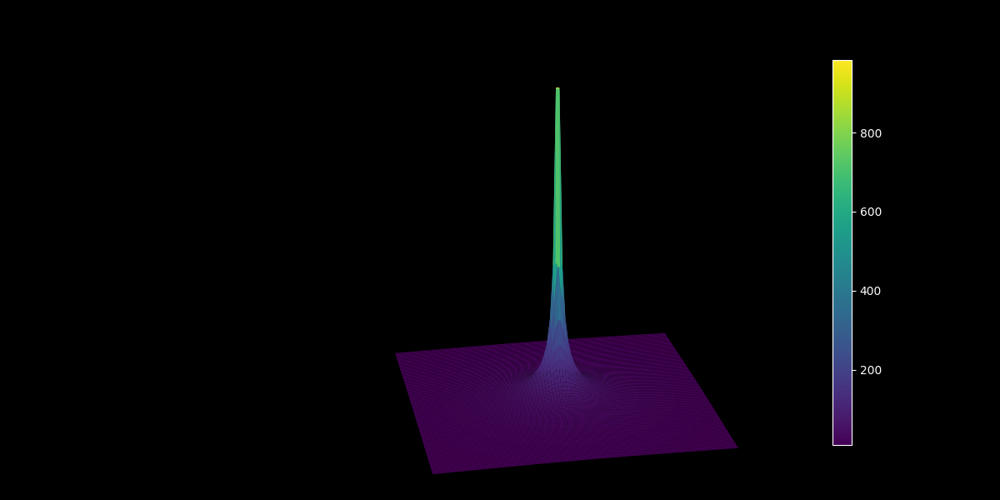

In [41]:
plotlogf(even_integrand_B, ZB.real-.001, ZB.real+.001, -ZB.imag-.001, -ZB.imag+.001,
        iref=100, rref=100, log_off=True, three_D=True, cstride=1, rstride=1,
        elev=20, azim=-101)

Now that is even more of a (seeming) pole.

But now we're back to the same problem we had.  If we do a contour integral around a pole with positive imaginary part, the growth of the resulting leaky mode is incorrect, it blows up as z increases.  Maybe there is a bug in the transform that is switching the locations of the poles...